# Movie Genre Classification [TF-IDF](https://scikit-learn.org/1.5/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html) and [Naive Bayes](https://scikit-learn.org/1.5/modules/naive_bayes.html)

### Temu Kembali Informasi 7C

This notebook is an example of how to use the TF-IDF and Naive Bayes algorithms to classify movie genres. And also this notebook for mid-term project of the course "Temu Kembali Informasi" in Univesity of Muhammadiyah Malang.

The dataset if from kaggle: https://www.kaggle.com/datasets/hijest/genre-classification-dataset-imdb

Download the dataset, name it "Genre Classification Dataset", and extract it to the folder where this notebook is located.

The dataset contains 3 files:
- `train_data.csv`: contains the movie title, plot, and genre.
- `test_data.csv`: contains the movie title, plot, and genre.
- `test_data_solution.csv`: contains the movie title, plot, and genre.
- `description.csv`: contains the train and test data description.

Then download the requirements.txt file and run the following command to install the required libraries:
```bash
pip install -r requirements.txt
```

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
from wordcloud import WordCloud

In [17]:
import nltk
import os

# Set the custom download path for NLTK data
custom_download_path = '/kaggle/working/nltk_data'

# print(custom_download_path)
# nltk_data_path = os.path.join(os.getcwd(), 'nltk_data')
# print(nltk_data_path)
# print(os.listdir(f"{custom_download_path}/corpora"))

# Make sure the directory exists; if not, create it
os.makedirs(custom_download_path, exist_ok=True)

# Append the custom download path to NLTK data path
nltk.data.path.append(custom_download_path)
  
# Download NLTK resources to the custom path
# nltk.download('punkt')
# nltk.download('stopwords')
# nltk.download('wordnet')

nltk.download('punkt', download_dir=custom_download_path)
nltk.download('punkt_tab', download_dir=custom_download_path)
nltk.download('stopwords', download_dir=custom_download_path)
nltk.download('wordnet', download_dir=custom_download_path)

[nltk_data] Downloading package punkt to /kaggle/working/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to
[nltk_data]     /kaggle/working/nltk_data...
[nltk_data]   Unzipping tokenizers\punkt_tab.zip.
[nltk_data] Downloading package stopwords to
[nltk_data]     /kaggle/working/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /kaggle/working/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [4]:
import warnings

# Ignore all warnings
warnings.filterwarnings("ignore")

In [5]:
# Read the txt files using pandas

train_data = pd.read_csv("Genre Classification Dataset/train_data.txt", delimiter=':::' ,header = None ,engine='python')
test_data  = pd.read_csv("Genre Classification Dataset/test_data.txt", delimiter=':::' ,header = None ,engine='python')
test_data_solution  = pd.read_csv("Genre Classification Dataset/test_data_solution.txt", delimiter=':::' ,header = None ,engine='python')

In [6]:
## View train data
print("shape",train_data.shape)
train_data.head()

shape (54214, 4)


,0,1,2,3
0,1,Oscar et la dame rose (2009),drama,Listening in to a conversation between his do...
1,2,Cupid (1997),thriller,A brother and sister with a past incestuous r...
2,3,"Young, Wild and Wonderful (1980)",adult,As the bus empties the students for their fie...
3,4,The Secret Sin (1915),drama,To help their unemployed father make ends mee...
4,5,The Unrecovered (2007),drama,The film's title refers not only to the un-re...


In [7]:
## View the test solution data
print("shape",test_data_solution.shape)
test_data_solution.head()

shape (54200, 4)


,0,1,2,3
0,1,Edgar's Lunch (1998),thriller,"L.R. Brane loves his life - his car, his apar..."
1,2,La guerra de papá (1977),comedy,"Spain, March 1964: Quico is a very naughty ch..."
2,3,Off the Beaten Track (2010),documentary,One year in the life of Albin and his family ...
3,4,Meu Amigo Hindu (2015),drama,"His father has died, he hasn't spoken with hi..."
4,5,Er nu zhai (1955),drama,Before he was known internationally as a mart...


In [8]:
## We will concat the test and train file

df = pd.concat((train_data ,test_data_solution))
df.columns = ["id" ,"Title","Genre","Description"]
df.head()

,id,Title,Genre,Description
0,1,Oscar et la dame rose (2009),drama,Listening in to a conversation between his do...
1,2,Cupid (1997),thriller,A brother and sister with a past incestuous r...
2,3,"Young, Wild and Wonderful (1980)",adult,As the bus empties the students for their fie...
3,4,The Secret Sin (1915),drama,To help their unemployed father make ends mee...
4,5,The Unrecovered (2007),drama,The film's title refers not only to the un-re...


In [9]:
## Check the size
df.shape

(108414, 4)

In [10]:
## Check for Duplicates and Remove them
df.duplicated().sum() ## Will give us a number of duplicates

df.drop_duplicates(inplace = True)  ## Will drops any duplicates

In [11]:
## Check for nan values

df.isna().sum()  # Will check for any duplicates

df.dropna( inplace = True ) ## Will drop any nan containing row if exists

In [12]:
## Check the size
df.shape

(108414, 4)

In [13]:
## function to preprocess the data
stopword = set(stopwords.words('english'))

def preprocessing(text):
    # Convert text to lowercase
    text = text.lower()

    # Remove punctuation using regular expressions
    text = re.sub(r'[^\w\s]', '', text)

    # Remove specific characters #, @, and $
    text = re.sub(r'[#@\$]', '', text)

    # tokenize and convert to list
    tokens = word_tokenize(text)

    ## Lemmatize it
    lemmatizer  = WordNetLemmatizer()

    ## lemmatize each token
    # text = [lemmatizer.lemmatize(token) for token in tokens]
    text = text.split()

    text = [word for word in text if word not in stopword]


    return " ".join(text)

In [ ]:
## Create list of words in discription column
df["Despcription_clean"] = df["Description"].apply(preprocessing)

In [30]:
df.head()

,id,Title,Genre,Description,Description_clean,Despcription_clean
0,1,Oscar et la dame rose (2009),drama,Listening in to a conversation between his do...,listening conversation doctor parents 10yearol...,listening conversation doctor parents 10yearol...
1,2,Cupid (1997),thriller,A brother and sister with a past incestuous r...,brother sister past incestuous relationship cu...,brother sister past incestuous relationship cu...
2,3,"Young, Wild and Wonderful (1980)",adult,As the bus empties the students for their fie...,bus empties students field trip museum natural...,bus empties students field trip museum natural...
3,4,The Secret Sin (1915),drama,To help their unemployed father make ends mee...,help unemployed father make ends meet edith tw...,help unemployed father make ends meet edith tw...
4,5,The Unrecovered (2007),drama,The film's title refers not only to the un-re...,films title refers unrecovered bodies ground z...,films title refers unrecovered bodies ground z...


In [31]:
## Shows us the label counts
df["Genre"].value_counts()

Genre
drama           27225
documentary     26192
comedy          14893
short           10145
horror           4408
thriller         3181
action           2629
western          2064
reality-tv       1767
family           1567
adventure        1550
music            1462
romance          1344
sci-fi           1293
adult            1180
crime            1010
animation         996
sport             863
talk-show         782
fantasy           645
mystery           637
musical           553
biography         529
history           486
game-show         387
news              362
war               264
Name: count, dtype: int64

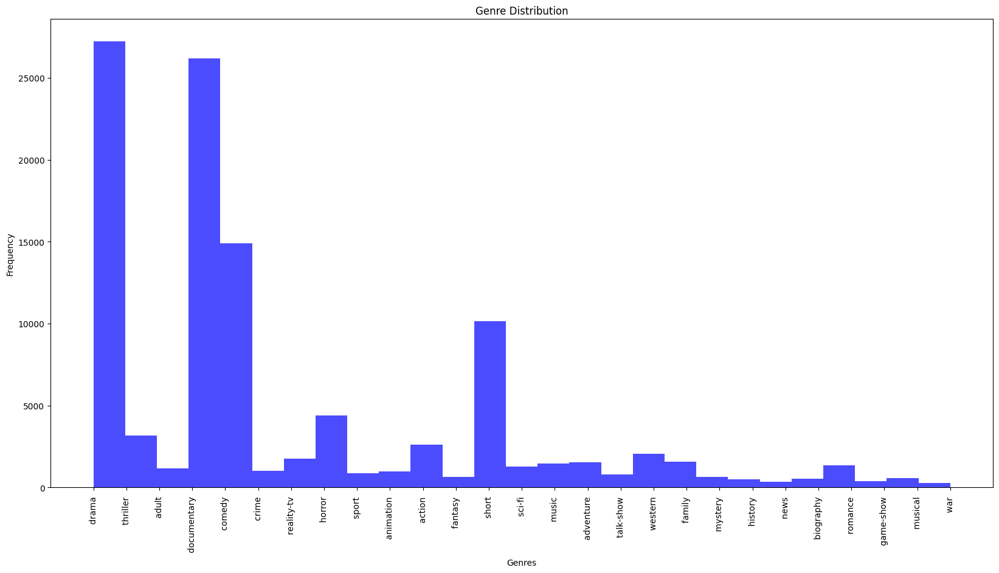

In [32]:
# Create a histogram of genre distribution
plt.figure(figsize=(20, 10))
plt.hist(df["Genre"],bins =27 , color='blue', alpha=0.7)
plt.title("Genre Distribution")
plt.xlabel("Genres")
plt.ylabel("Frequency")
plt.xticks(rotation=90)
plt.show()

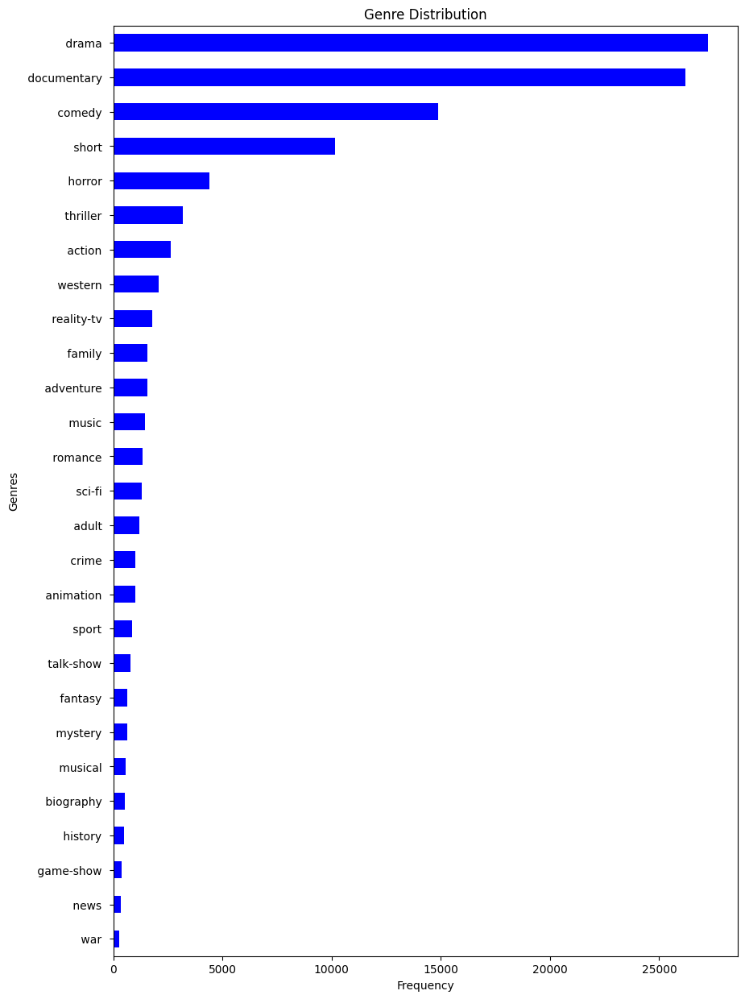

In [33]:
## View genre distribution on Horizontal graph

genre_counts = df["Genre"].value_counts()
sorted_genres = genre_counts.sort_values(ascending=True)
# Create a horizontal histogram of genre distribution
plt.figure(figsize=(10, 15))
sorted_genres.plot(kind='barh',color = "blue", alpha=1 )
plt.title("Genre Distribution")
plt.xlabel("Frequency")
plt.ylabel("Genres")
plt.show()

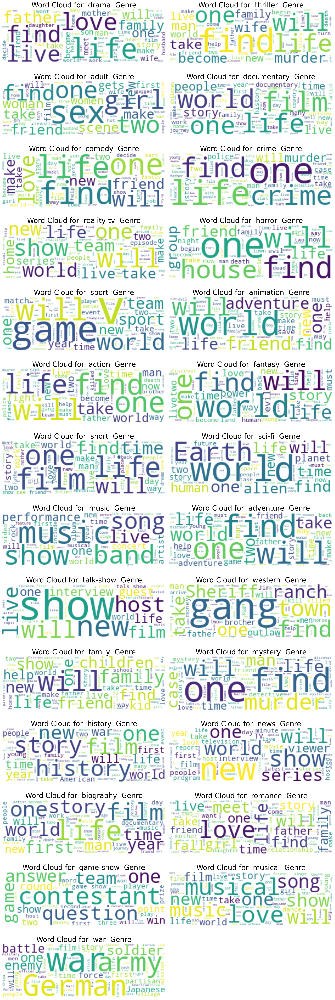

In [34]:
## Below code will generate wordcloud of each genre

# Create a list of unique genres from the dataset
genres = df['Genre'].unique()

# Set the figure size outside the loop
plt.figure(figsize=(20, 60))

# Iterate over each genre
for i, genre in enumerate(genres, 1):
    plt.subplot(14, 2, i)  # Assuming you have 14 rows and 2 columns for 28 genres
    text_subset = " ".join(list(df[df["Genre"] == genre]['Description']))
    wordcloud = WordCloud(max_words=300, width=300, height=100, background_color='white').generate(text_subset)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for {genre} Genre',fontsize=30)
    plt.axis('off')


plt.tight_layout()
plt.show()

In [35]:
## import necessary library for
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.model_selection import train_test_split

from sklearn.metrics import classification_report,confusion_matrix,ConfusionMatrixDisplay

In [36]:
#Convert sentiment labels to numerical values for modeling
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
data['Genre_encoded'] = label_encoder.fit_transform(data['Genre'])
data['Genre_encoded']

class_names= list(label_encoder.classes_)
class_names

[' action ',
 ' adult ',
 ' adventure ',
 ' animation ',
 ' biography ',
 ' comedy ',
 ' crime ',
 ' documentary ',
 ' drama ',
 ' family ',
 ' fantasy ',
 ' game-show ',
 ' history ',
 ' horror ',
 ' music ',
 ' musical ',
 ' mystery ',
 ' news ',
 ' reality-tv ',
 ' romance ',
 ' sci-fi ',
 ' short ',
 ' sport ',
 ' talk-show ',
 ' thriller ',
 ' war ',
 ' western ']

In [37]:
data.head()

,Genre,Description,Description_clean,Genre_encoded
0,drama,Listening in to a conversation between his do...,listening conversation doctor parents 10yearol...,8
1,thriller,A brother and sister with a past incestuous r...,brother sister past incestuous relationship cu...,24
2,adult,As the bus empties the students for their fie...,bus empties students field trip museum natural...,1
3,drama,To help their unemployed father make ends mee...,help unemployed father make ends meet edith tw...,8
4,drama,The film's title refers not only to the un-re...,films title refers unrecovered bodies ground z...,8


In [45]:
## Split the data
x = data["Description_clean"]
y = data["Genre"]

x_train ,x_test ,y_train ,y_test = train_test_split(x ,y ,test_size = 0.5)

In [46]:
vectorize = CountVectorizer()
x_train1 = vectorize.fit_transform(x_train)
x_test1 =  vectorize.transform(x_test)

Model Score on Training data 0.6403785488958991
Model Score on Training data 0.5247477263084104
               precision    recall  f1-score   support

      action        0.03      0.58      0.05        65
       adult        0.01      0.73      0.03        11
   adventure        0.06      0.51      0.11        91
   animation        0.00      0.00      0.00         0
   biography        0.00      0.00      0.00         5
      comedy        0.45      0.53      0.48      6284
       crime        0.00      0.00      0.00         1
 documentary        0.90      0.57      0.69     20926
       drama        0.83      0.46      0.59     24382
      family        0.01      1.00      0.01         5
     fantasy        0.00      0.00      0.00         0
   game-show        0.16      1.00      0.28        31
     history        0.00      0.00      0.00         0
      horror        0.29      0.76      0.42       812
       music        0.07      0.93      0.13        55
     musical        0.0

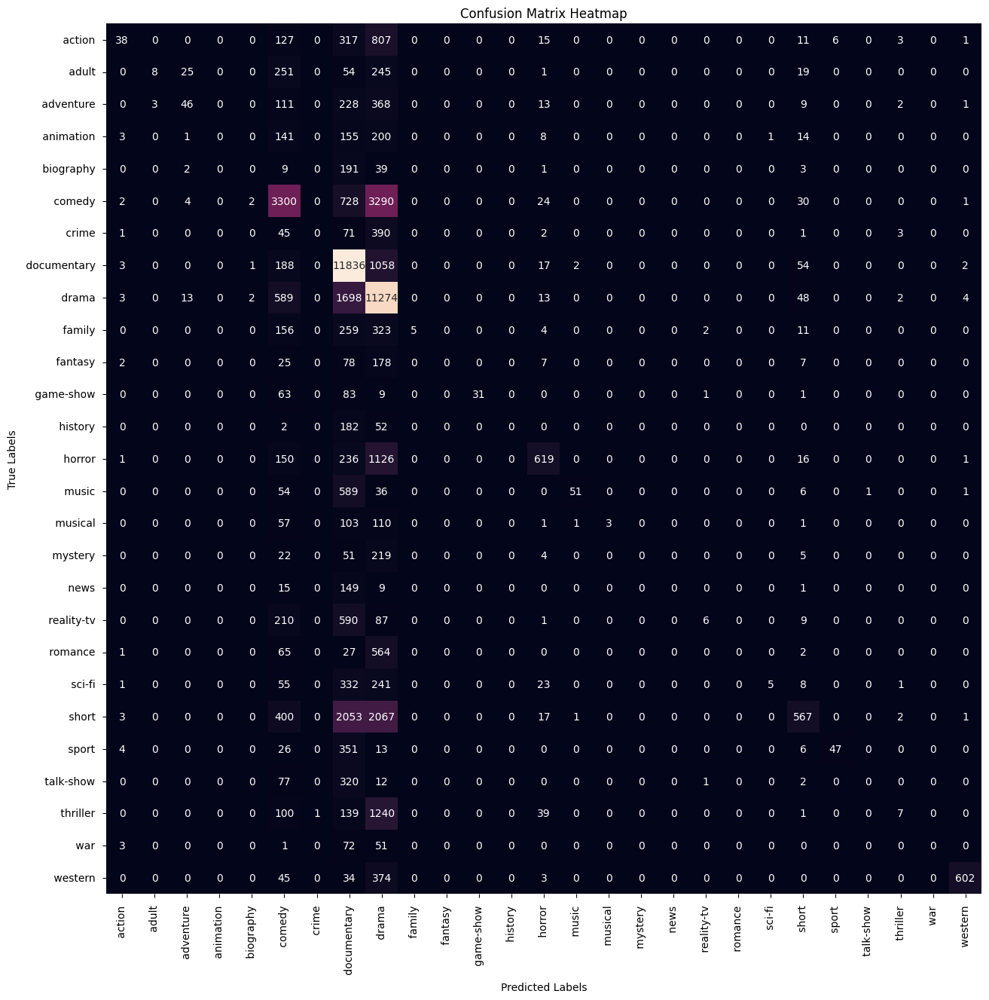

In [47]:
mnb = MultinomialNB()
mnb.fit(x_train1 ,y_train)
print("Model Score on Training data",mnb.score(x_train1 ,y_train))
print("Model Score on Training data",mnb.score(x_test1 ,y_test))
y_pred = mnb.predict(x_test1)

print(classification_report(y_pred ,y_test))

cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False,
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

Model Score on Training data 0.9970667994908406
Model Score on Training data 0.5692253767963548
               precision    recall  f1-score   support

      action        0.32      0.41      0.36      1037
       adult        0.38      0.65      0.48       350
   adventure        0.22      0.42      0.29       409
   animation        0.15      0.40      0.22       194
   biography        0.00      0.03      0.01        36
      comedy        0.57      0.53      0.55      8074
       crime        0.09      0.22      0.13       206
 documentary        0.78      0.71      0.74     14495
       drama        0.69      0.56      0.62     16861
      family        0.18      0.32      0.23       431
     fantasy        0.09      0.20      0.12       128
   game-show        0.53      0.82      0.64       120
     history        0.03      0.15      0.06        54
      horror        0.60      0.62      0.61      2072
       music        0.50      0.63      0.56       590
     musical        0.1

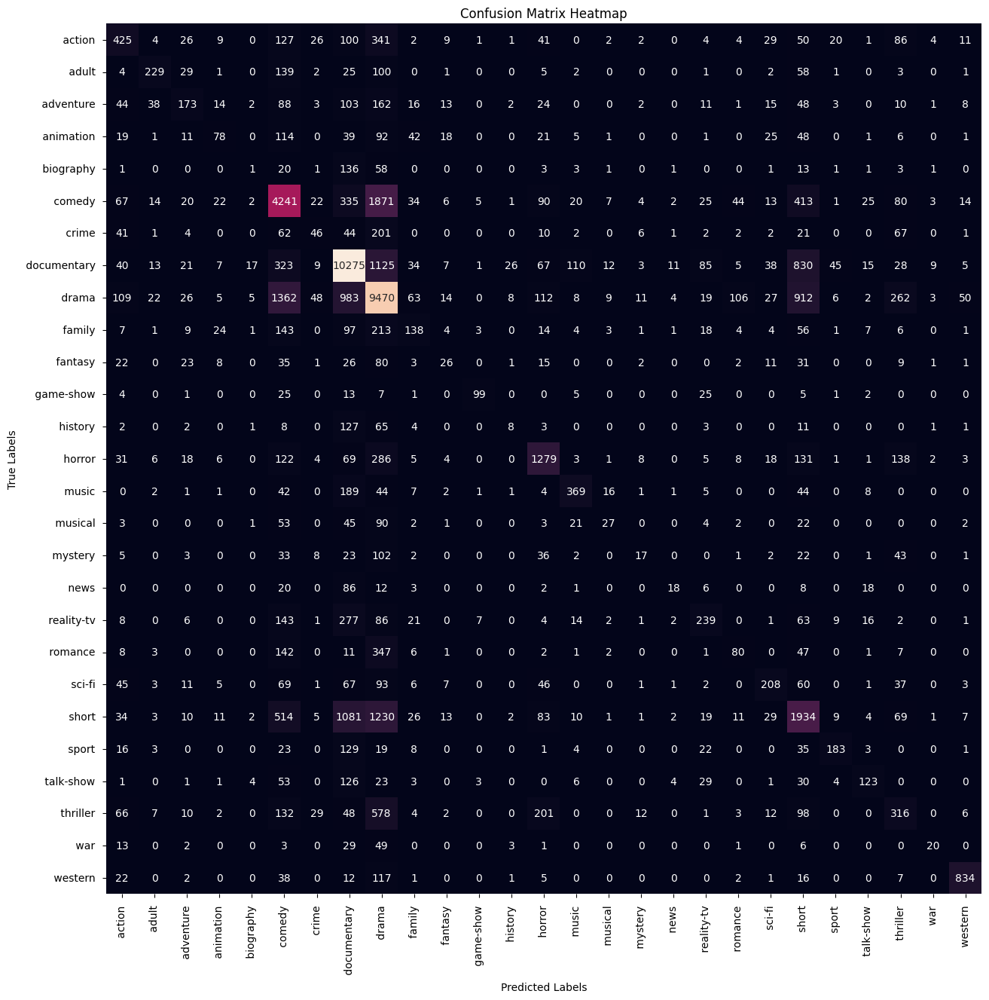

In [48]:
## select Logistic regression for this
model = LogisticRegression()
model.fit(x_train1 ,y_train)
print("Model Score on Training data",model.score(x_train1 ,y_train))
print("Model Score on Training data",model.score(x_test1 ,y_test))
y_pred = model.predict(x_test1)
print(classification_report(y_pred ,y_test))


cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False,
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

Model Score on Training data 0.9996863873669453
Model Score on Training data 0.5186230560628701
               precision    recall  f1-score   support

      action        0.28      0.32      0.30      1185
       adult        0.36      0.49      0.42       449
   adventure        0.22      0.31      0.26       542
   animation        0.14      0.25      0.18       300
   biography        0.00      0.00      0.00       123
      comedy        0.51      0.49      0.50      7743
       crime        0.11      0.18      0.14       311
 documentary        0.73      0.69      0.71     13878
       drama        0.61      0.54      0.57     15333
      family        0.16      0.21      0.18       573
     fantasy        0.09      0.12      0.10       218
   game-show        0.54      0.75      0.63       134
     history        0.05      0.10      0.06       113
      horror        0.57      0.56      0.56      2205
       music        0.46      0.56      0.51       615
     musical        0.1

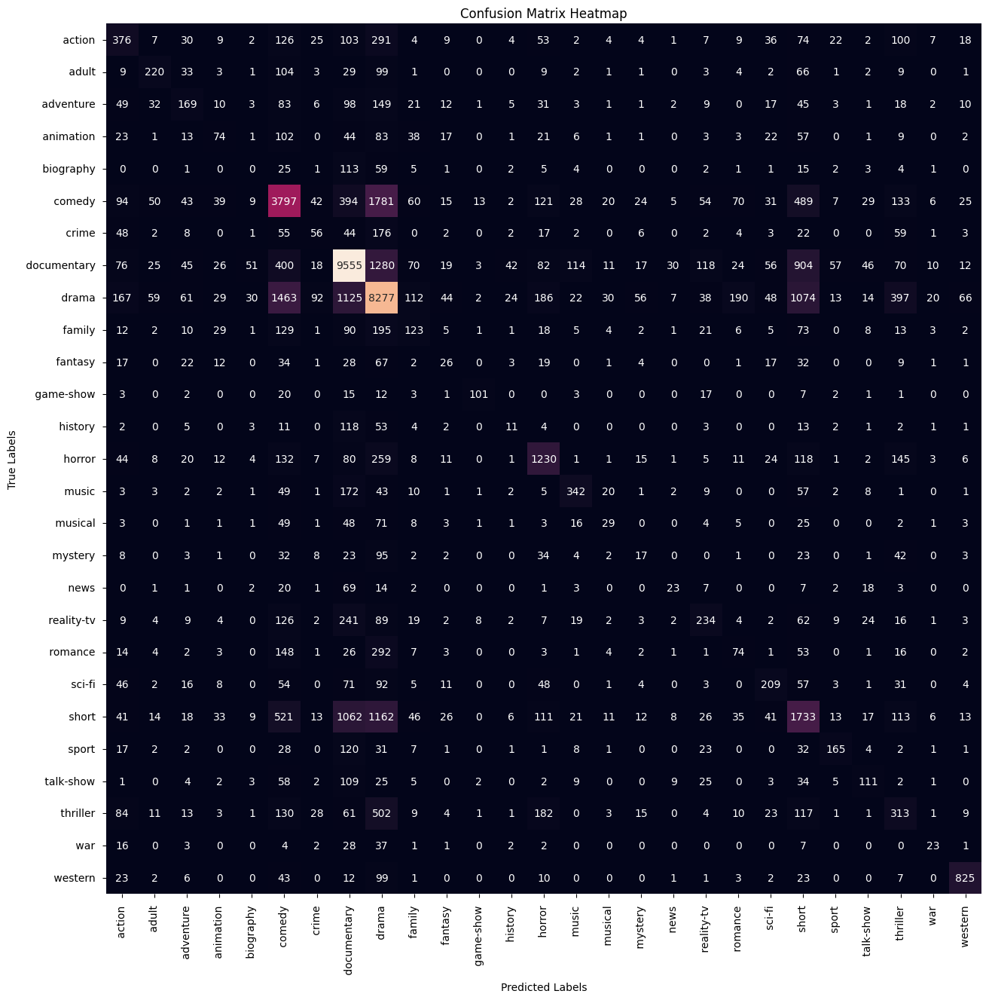

In [49]:
## Select SVC model

svm = LinearSVC()
svm.fit(x_train1 ,y_train)
print("Model Score on Training data",svm.score(x_train1 ,y_train))
print("Model Score on Training data",svm.score(x_test1 ,y_test))
y_pred = svm.predict(x_test1)
print(classification_report(y_pred ,y_test))
## As we can see from accuracy that the model the not performing well



cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False,
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

Random Forest - Train Score: 0.9996863873669453
Random Forest - Test Score: 0.4918368476396037
               precision    recall  f1-score   support

      action        0.01      0.59      0.02        27
       adult        0.08      0.78      0.15        64
   adventure        0.10      0.74      0.18       106
   animation        0.00      0.00      0.00         3
   biography        0.00      0.00      0.00         0
      comedy        0.26      0.54      0.35      3629
       crime        0.00      1.00      0.00         1
 documentary        0.89      0.56      0.69     20796
       drama        0.85      0.41      0.56     27943
      family        0.02      0.75      0.05        24
     fantasy        0.00      0.00      0.00         0
   game-show        0.41      0.95      0.57        81
     history        0.00      0.50      0.01         2
      horror        0.12      0.71      0.21       376
       music        0.09      0.90      0.17        77
     musical        0.02

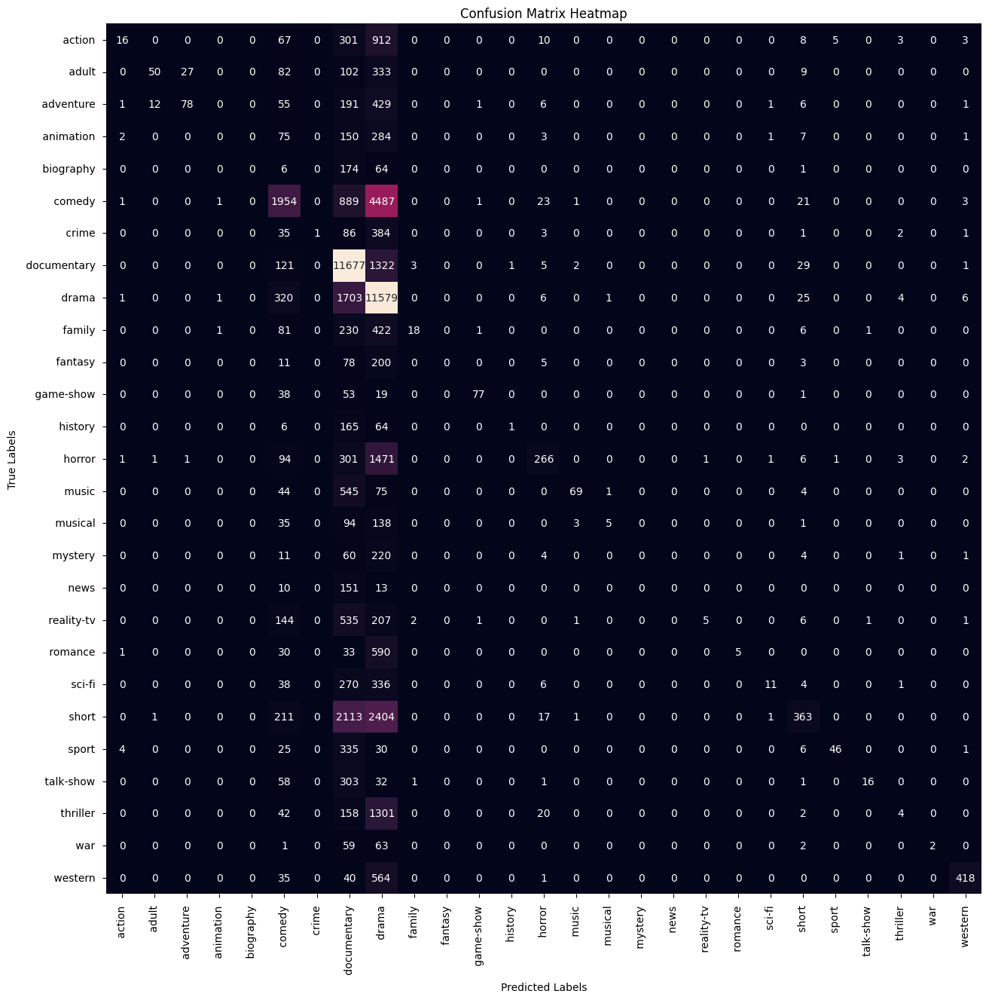

In [50]:
# Create a Random Forest model
random_forest = RandomForestClassifier()

# Fit the model with GridSearchCV
random_forest.fit(x_train1, y_train)
print("Random Forest - Train Score:",random_forest.score(x_train1, y_train))
print("Random Forest - Test Score:", random_forest.score(x_test1, y_test))

y_pred = random_forest.predict(x_test1)
print(classification_report(y_pred ,y_test))

cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False,
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

In [51]:
## Using TfidfVectorizer technique
vectorizer = TfidfVectorizer()
x_train2 = vectorize.fit_transform(x_train)
x_test2 =  vectorize.transform(x_test)

Model Score on Training data 0.6403785488958991
Model Score on Training data 0.5247477263084104
               precision    recall  f1-score   support

      action        0.03      0.58      0.05        65
       adult        0.01      0.73      0.03        11
   adventure        0.06      0.51      0.11        91
   animation        0.00      0.00      0.00         0
   biography        0.00      0.00      0.00         5
      comedy        0.45      0.53      0.48      6284
       crime        0.00      0.00      0.00         1
 documentary        0.90      0.57      0.69     20926
       drama        0.83      0.46      0.59     24382
      family        0.01      1.00      0.01         5
     fantasy        0.00      0.00      0.00         0
   game-show        0.16      1.00      0.28        31
     history        0.00      0.00      0.00         0
      horror        0.29      0.76      0.42       812
       music        0.07      0.93      0.13        55
     musical        0.0

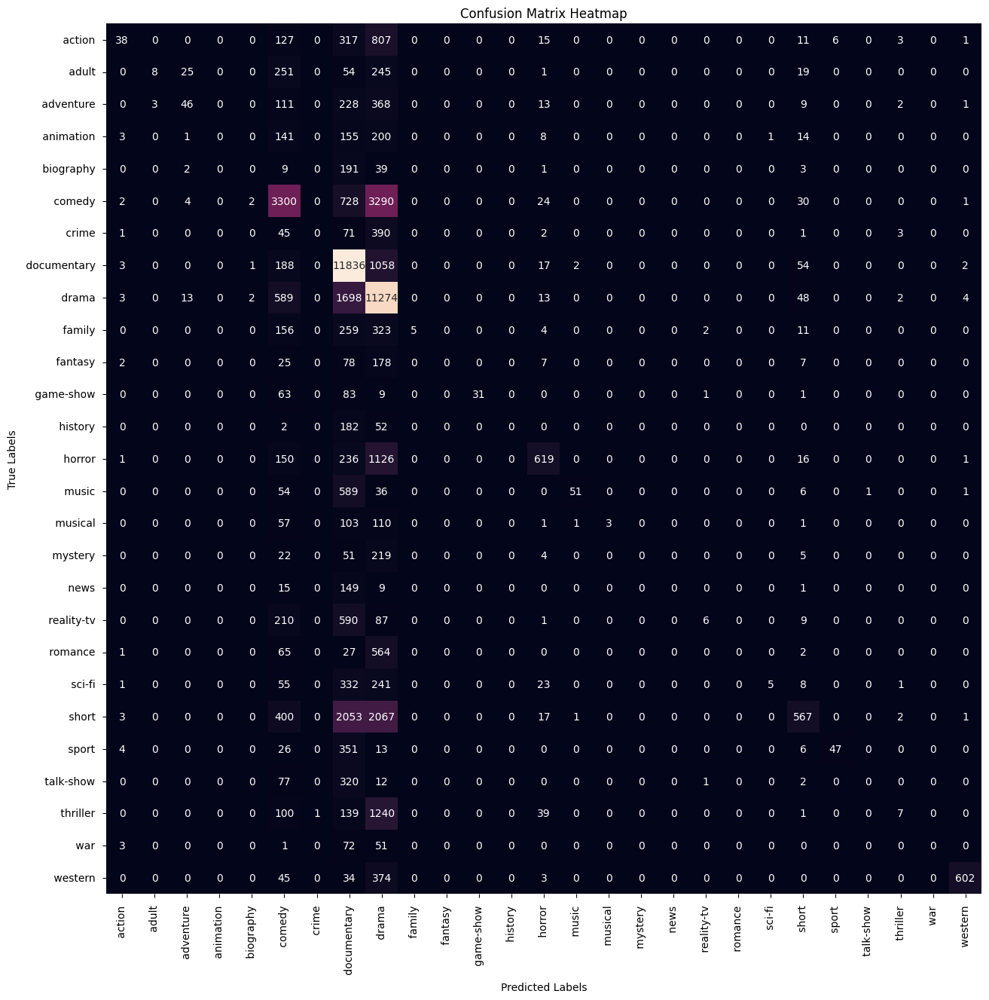

In [52]:
mnb = MultinomialNB()
mnb.fit(x_train2 ,y_train)
print("Model Score on Training data",mnb.score(x_train2 ,y_train))
print("Model Score on Training data",mnb.score(x_test2 ,y_test))
y_pred = mnb.predict(x_test2)
print(classification_report(y_pred ,y_test))


cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False,
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

Model Score on Training data 0.9970667994908406
Model Score on Training data 0.5692253767963548
               precision    recall  f1-score   support

      action        0.32      0.41      0.36      1037
       adult        0.38      0.65      0.48       350
   adventure        0.22      0.42      0.29       409
   animation        0.15      0.40      0.22       194
   biography        0.00      0.03      0.01        36
      comedy        0.57      0.53      0.55      8074
       crime        0.09      0.22      0.13       206
 documentary        0.78      0.71      0.74     14495
       drama        0.69      0.56      0.62     16861
      family        0.18      0.32      0.23       431
     fantasy        0.09      0.20      0.12       128
   game-show        0.53      0.82      0.64       120
     history        0.03      0.15      0.06        54
      horror        0.60      0.62      0.61      2072
       music        0.50      0.63      0.56       590
     musical        0.1

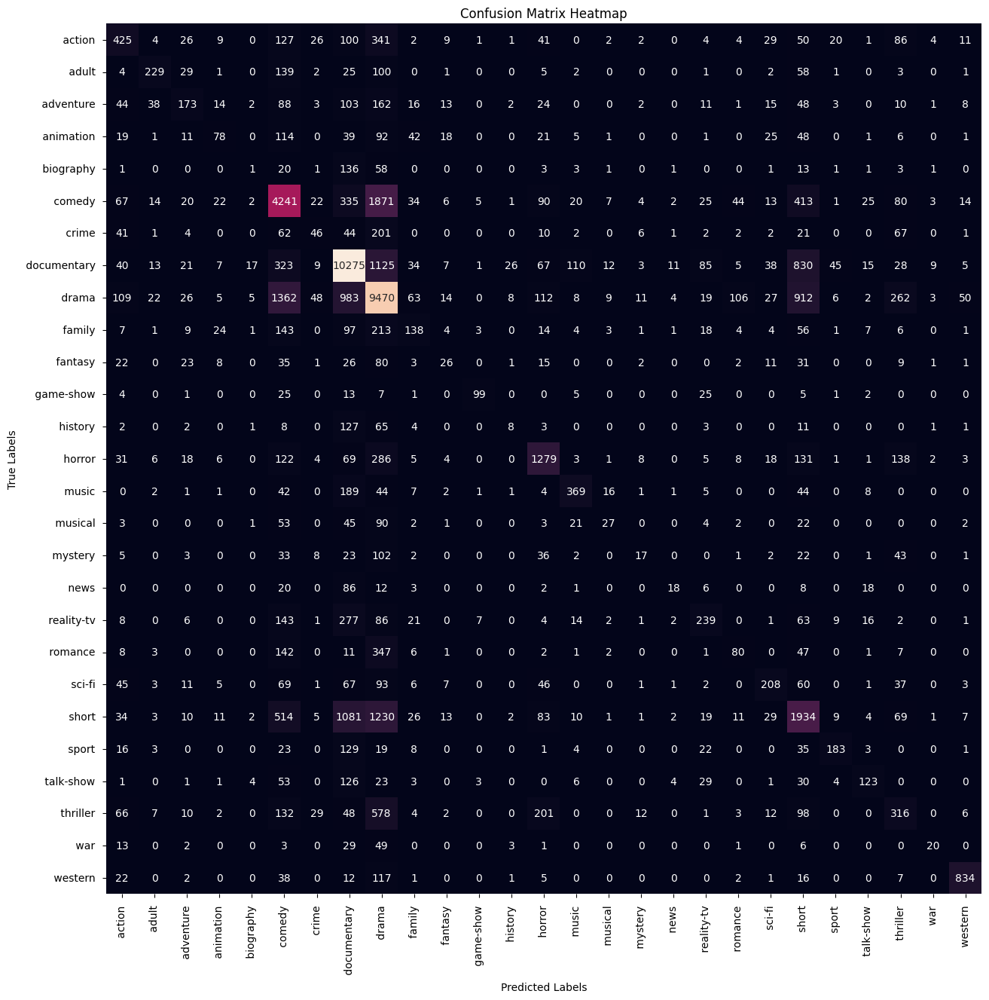

In [53]:
## select Logistic regression for this
model = LogisticRegression()
model.fit(x_train2 ,y_train)
print("Model Score on Training data",model.score(x_train2 ,y_train))
print("Model Score on Training data",model.score(x_test2 ,y_test))
y_pred = model.predict(x_test2)
print(classification_report(y_pred ,y_test))


cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False,
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

Model Score on Training data 0.9996863873669453
Model Score on Training data 0.5186046082609257
               precision    recall  f1-score   support

      action        0.28      0.32      0.30      1184
       adult        0.36      0.49      0.42       451
   adventure        0.22      0.31      0.26       542
   animation        0.14      0.25      0.18       300
   biography        0.00      0.00      0.00       123
      comedy        0.51      0.49      0.50      7745
       crime        0.11      0.18      0.14       310
 documentary        0.73      0.69      0.71     13879
       drama        0.61      0.54      0.57     15332
      family        0.16      0.22      0.18       572
     fantasy        0.09      0.12      0.10       218
   game-show        0.54      0.75      0.63       135
     history        0.05      0.10      0.06       113
      horror        0.57      0.56      0.56      2205
       music        0.46      0.56      0.51       615
     musical        0.1

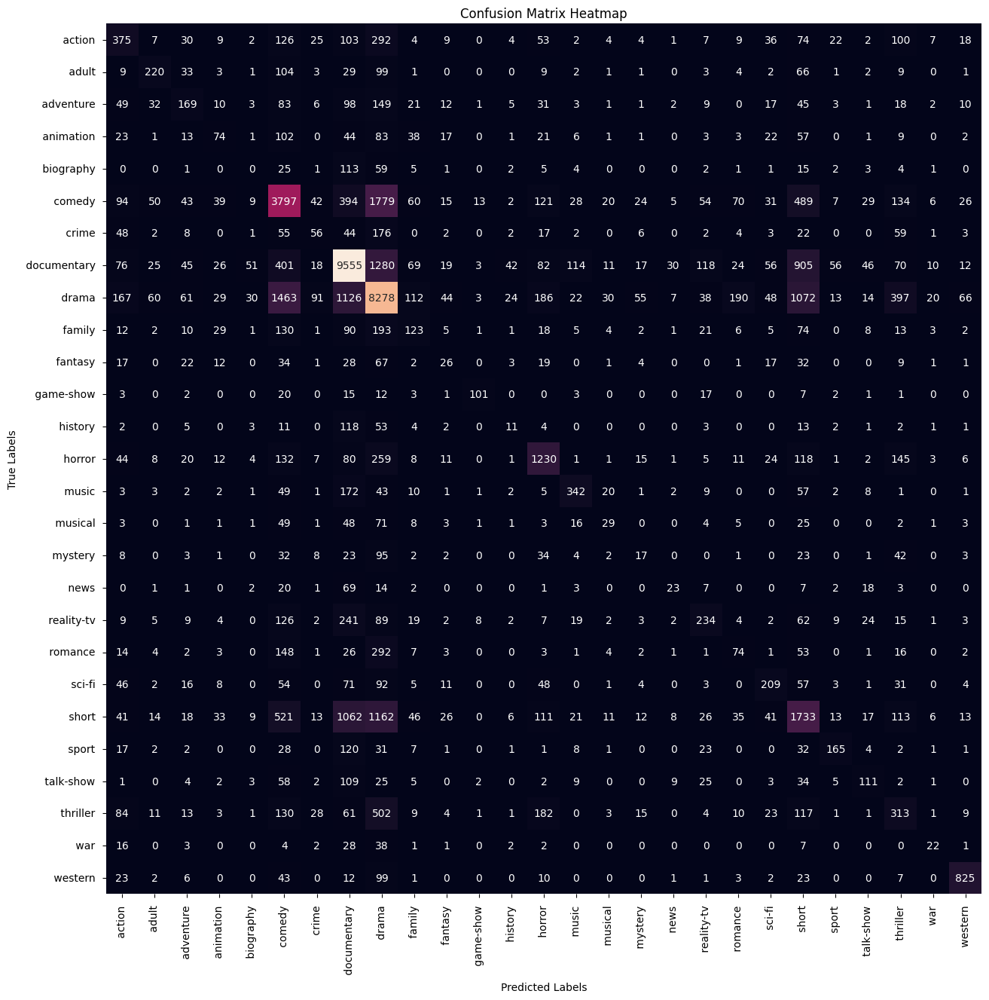

In [54]:
## Select SVC model

svm = LinearSVC()
svm.fit(x_train2 ,y_train)
print("Model Score on Training data",svm.score(x_train2 ,y_train))
print("Model Score on Training data",svm.score(x_test2 ,y_test))
y_pred = svm.predict(x_test2)
print(classification_report(y_pred ,y_test))
## As we can see from accuracy that the model the not performing well

cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False,
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

Random Forest - Train Score: 0.9996863873669453
Random Forest - Test Score: 0.49355249322043276
               precision    recall  f1-score   support

      action        0.01      0.54      0.02        24
       adult        0.06      0.74      0.10        46
   adventure        0.11      0.75      0.19       114
   animation        0.00      0.00      0.00         3
   biography        0.00      0.00      0.00         0
      comedy        0.27      0.55      0.37      3630
       crime        0.00      1.00      0.00         1
 documentary        0.89      0.56      0.69     20724
       drama        0.85      0.41      0.56     28013
      family        0.03      0.76      0.05        25
     fantasy        0.00      0.00      0.00         0
   game-show        0.44      0.91      0.59        90
     history        0.00      0.00      0.00         1
      horror        0.13      0.71      0.22       388
       music        0.09      0.88      0.16        76
     musical        0.0

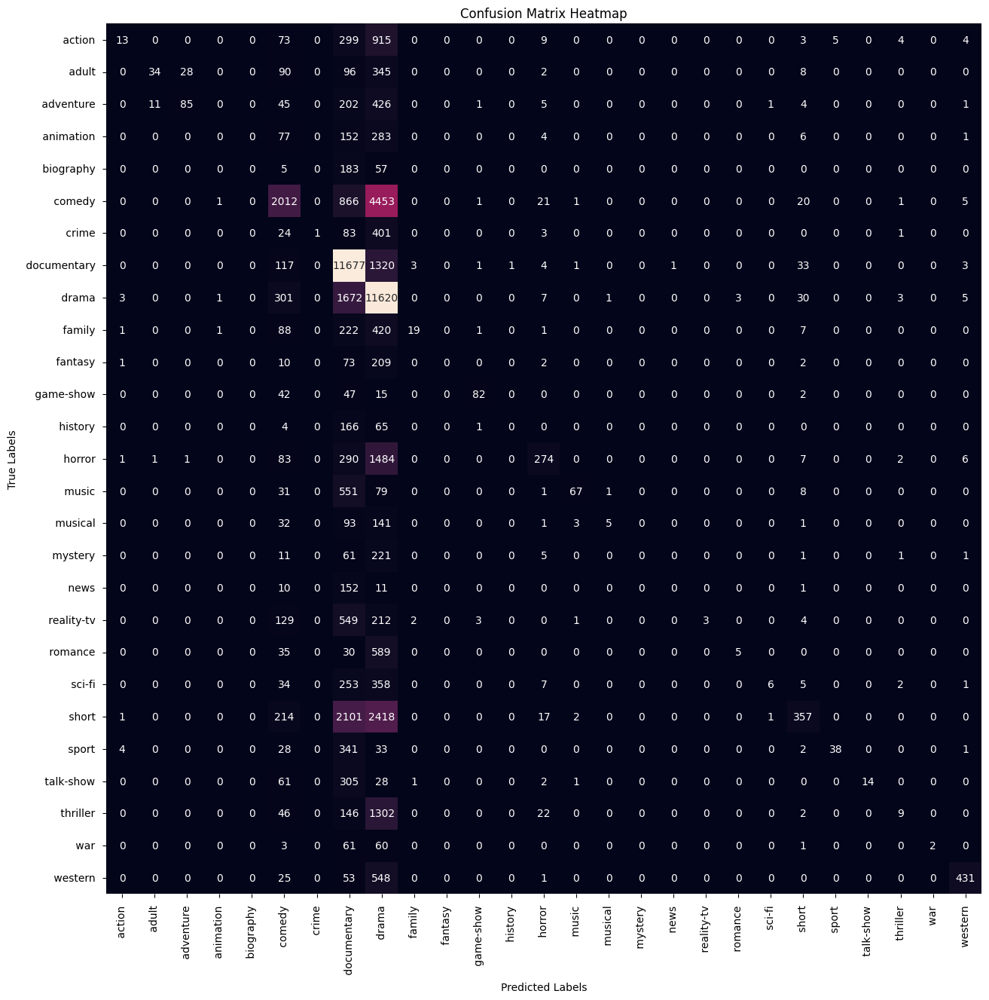

In [55]:
# Create a Random Forest model
random_forest = RandomForestClassifier()

# Fit the model with GridSearchCV
random_forest.fit(x_train2, y_train)

print("Random Forest - Train Score:",random_forest.score(x_train2, y_train))
print("Random Forest - Test Score:", random_forest.score(x_test2, y_test))

y_pred = random_forest.predict(x_test2)
print(classification_report(y_pred ,y_test))

cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False,
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

In [56]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC

In [57]:
# Create Naive Bayes model
naive_bayes = MultinomialNB()
naive_bayes.fit(x_train2, y_train)

MultinomialNB()

In [58]:
# Evaluate Naive Bayes model
print("Naive Bayes - Train Score:", naive_bayes.score(x_train2, y_train))
print("Naive Bayes - Test Score:", naive_bayes.score(x_test2, y_test))
y_pred_nb = naive_bayes.predict(x_test2)
print("Naive Bayes Classification Report:")
print(classification_report(y_pred_nb, y_test))

Naive Bayes - Train Score: 0.6403785488958991
Naive Bayes - Test Score: 0.5247477263084104
Naive Bayes Classification Report:
               precision    recall  f1-score   support

      action        0.03      0.58      0.05        65
       adult        0.01      0.73      0.03        11
   adventure        0.06      0.51      0.11        91
   animation        0.00      0.00      0.00         0
   biography        0.00      0.00      0.00         5
      comedy        0.45      0.53      0.48      6284
       crime        0.00      0.00      0.00         1
 documentary        0.90      0.57      0.69     20926
       drama        0.83      0.46      0.59     24382
      family        0.01      1.00      0.01         5
     fantasy        0.00      0.00      0.00         0
   game-show        0.16      1.00      0.28        31
     history        0.00      0.00      0.00         0
      horror        0.29      0.76      0.42       812
       music        0.07      0.93      0.13    

In [59]:
# Create Logistic Regression model
logistic_regression = LogisticRegression()
logistic_regression.fit(x_train2, y_train)

LogisticRegression()

In [60]:
# Evaluate Logistic Regression model
print("\nLogistic Regression - Train Score:", logistic_regression.score(x_train2, y_train))
print("Logistic Regression - Test Score:", logistic_regression.score(x_test2, y_test))
y_pred_lr = logistic_regression.predict(x_test2)
print("Logistic Regression Classification Report:")
print(classification_report(y_pred_lr, y_test))


Logistic Regression - Train Score: 0.9970667994908406
Logistic Regression - Test Score: 0.5692253767963548
Logistic Regression Classification Report:
               precision    recall  f1-score   support

      action        0.32      0.41      0.36      1037
       adult        0.38      0.65      0.48       350
   adventure        0.22      0.42      0.29       409
   animation        0.15      0.40      0.22       194
   biography        0.00      0.03      0.01        36
      comedy        0.57      0.53      0.55      8074
       crime        0.09      0.22      0.13       206
 documentary        0.78      0.71      0.74     14495
       drama        0.69      0.56      0.62     16861
      family        0.18      0.32      0.23       431
     fantasy        0.09      0.20      0.12       128
   game-show        0.53      0.82      0.64       120
     history        0.03      0.15      0.06        54
      horror        0.60      0.62      0.61      2072
       music        0.5

In [ ]:
# Create Support Vector Machines (SVM) model
svm_classifier = SVC()
svm_classifier.fit(x_train2, y_train)

In [ ]:
# Evaluate SVM model
print("\nSupport Vector Machines (SVM) - Train Score:", svm_classifier.score(x_train2, y_train))
print("Support Vector Machines (SVM) - Test Score:", svm_classifier.score(x_test2, y_test))
y_pred_svm = svm_classifier.predict(x_test2)
print("SVM Classification Report:")
print(classification_report(y_pred_svm, y_test))